# Section 3.1 Overview of disease-specific co-expression networks

In [1]:
import getpass
import json
import os
import sys
import time

import matplotlib as mpl
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import pyobo
import seaborn as sns
from matplotlib import colors
from network_utils import create_network_from_edge_file, edge_file_path
from networkx.drawing.nx_pydot import graphviz_layout
from tqdm import tqdm

In [2]:
getpass.getuser()

'rfigueiredo'

In [3]:
sys.version

'3.9.1 (v3.9.1:1e5d33e9b9, Dec  7 2020, 12:10:52) \n[Clang 6.0 (clang-600.0.57)]'

In [4]:
time.asctime()

'Sat Feb 27 12:03:31 2021'

##### Increase figure quality

In [5]:
mpl.rcParams['figure.dpi'] = 320

## Load data
#### download data from https://doi.org/10.5281/zenodo.4572853 and place the folder 'data/' in the root of the repository, or if placed elsewhere, write the full path to 'data/' as the variable data_dir below

#### optional: select your desired location of the output figures

In [6]:
# replace here the location of the data dir if not structured as instructed
data_dir = "../data"

# optional, replace here the desired location of the output figures
figures_dir = os.path.join(os.path.expanduser("~"), "coexpath_figures")
os.makedirs(figures_dir, exist_ok=True)

##### Load co-expression networks

In [7]:
network_dict = {
    doid : create_network_from_edge_file(edge_file_path(os.path.join(data_dir, "final_coexprNets"), doid), doid)
    for doid in tqdm(os.listdir(os.path.join(data_dir, "final_coexprNets")), desc="Creating/loading network objects")
}

Creating/loading network objects: 100%|██████████| 64/64 [05:33<00:00,  5.21s/it]


##### Load cluster assignments

In [8]:
with open(os.path.join(data_dir, 'misc_data', 'doid_group_clusters_dict.json'), 'r') as f:
    doids_per_cluster = json.load(f)

doid_cluster_mapping = {doid : cluster for cluster, doid_list in doids_per_cluster.items() for doid in doid_list}

##### Load metadata 

In [9]:
metaDataFINAL = pd.read_csv(os.path.join(data_dir, "misc_data", "metadata_FINAL.tsv"), sep="\t", index_col=0)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,10,12,15,17) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


##### Load dataset overview - (list which datasets were able to be downloaded)

In [10]:
dataset_overview = pd.read_excel(os.path.join(data_dir, "build_coexp_network", "OverviewDatasets.xlsx"), engine='openpyxl', usecols=["dataset ID","loaded?"])
ok_datasets = list(dataset_overview.loc[dataset_overview["loaded?"] == "ok"]["dataset ID"])

##### Load disease name mappings

In [11]:
doid_mappings = pyobo.get_id_name_mapping('doid')
doid_mappings["normal"] = "normal"
name_to_doid_mappings = pyobo.get_name_id_mapping('doid')
name_to_doid_mappings["normal"] = "normal"

## Prepare data

##### Sort doids per cluster by number of nodes

In [12]:
doids_per_cluster = {group: sorted(doids, key=lambda doid: len(network_dict[doid].nodes()),reverse=True)
                     for group, doids in doids_per_cluster.items() if group != "Normal"}

##### Convert node count data to dataframe

In [13]:
disease_and_node_num_per_cluster = {}

#use a count to preserve ordering
count = 0 
for cluster, doids in doids_per_cluster.items():
    for doid in doids:
        disease_and_node_num_per_cluster[count] = {
            "Disease group":cluster,
            "Disease" : doid_mappings[doid].capitalize(),
            "Number of nodes" : len(network_dict[doid].nodes()),
        }
        count +=1

node_count_df = pd.DataFrame(disease_and_node_num_per_cluster.values(),index=disease_and_node_num_per_cluster.keys())

##### Prepare colormap

In [14]:
color_list = [
    "#aaa94a", 
    "#1F77B4", 
    "#FF7F0E", 
    "#2CA02C", 
    "#D62728", 
    "#9467BD", 
    "#8C564B", 
    "#E377C2", 
    "#ffff33", 
    "#17BECF", 
    "#c7c7c7",
]

c_palette = sns.color_palette(color_list, n_colors=11)

## Figure: Overview on the number of nodes of each of the co-expression networks clustered by major disease groups

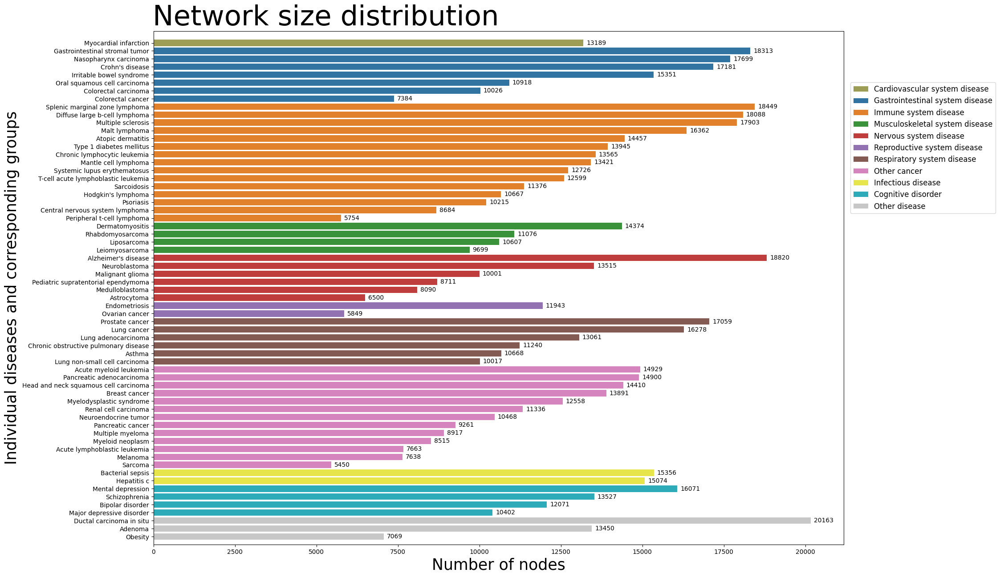

In [15]:
sns.reset_defaults()

f, ax = plt.subplots(figsize=(20, 15))

#the node_count_df has the preserved intended order
legend_order = node_count_df["Disease group"].unique()

sns.barplot(x="Number of nodes", y="Disease", hue="Disease group", hue_order=legend_order, data = node_count_df, palette=c_palette, dodge=False)

#extend chart above and below
ax.set_ylim([len(node_count_df),-1.5])

plt.title("Network size distribution", fontsize=45, x=0.25)

ax.set_xlabel(ax.get_xlabel(), fontsize=25)
ax.set_ylabel("Individual diseases and corresponding groups", fontsize=25)

for p in ax.patches:
    #label bars
    ax.annotate(int(np.nan_to_num(p.get_width(), 0)), xy=(p.get_width(), p.get_y()+p.get_height()/2),
                    xytext=(5, 0), textcoords='offset points', ha="left", va="center")
    
#move legend to outside 
plt.legend(bbox_to_anchor=(1.01, 0.9), loc=2, borderaxespad=0.,fontsize='large')

#save figure
plt.savefig(os.path.join(figures_dir, "Network_Size_Distribution.png"), bbox_inches='tight',dpi=320)
plt.show()

## Table: Disease overview

##### Get list of diseases by doid and name

In [16]:
doids = network_dict.keys()
disease_names = [doid_mappings[doid] for doid in doids]

##### Get metadata per disease, filter out samples that came from datasets that wouldn't load

In [17]:
metaData_by_disease = {dis : metaDataFINAL.loc[(metaDataFINAL["diseaseTerm"] == dis) | (metaDataFINAL["diseaseTerm2"] == dis)] 
          for dis in disease_names}

In [18]:
metaData_by_doid = {name_to_doid_mappings[dis]: df.loc[df["acc_dataset"].isin(ok_datasets) ] for dis, df in metaData_by_disease.items()}

##### Collect stats

In [19]:
disease_info = {
    doid : {
        "Name": doid_mappings[doid], 
        "Number of datasets": len(df.acc_dataset.unique()), 
        "Number of samples": len(df), 
        "Number of nodes": len(network_dict[doid].nodes()),
        "Number of edges": len(network_dict[doid].edges()),
        "Cluster": doid_cluster_mapping[doid]
    }
    for doid, df in metaData_by_doid.items()
}


##### Write to file

In [20]:
with open(os.path.join(figures_dir, "disease_overview.tsv"),"w") as f:
    f.write("doid\tdisease_name\tnumber_experiments\tnumber_samples\tnumber_nodes_in_net\tnumber_edges_in_net\tcluster_group\n")
    for doid, info in sorted(disease_info.items(), reverse=True, key=lambda item: item[1]['Number of samples']):
        if doid == "normal":
            f.write(f'NA\tnormal\t{info["Number of datasets"]}\t{info["Number of samples"]}\t{info["Number of nodes"]}\t{info["Number of edges"]}\t{info["Cluster"]}\n')
        else:
            f.write(f'doid:{doid}\t{info["Name"]}\t{info["Number of datasets"]}\t{info["Number of samples"]}\t{info["Number of nodes"]}\t{info["Number of edges"]}\t{info["Cluster"]}\n')

## Figure: Correlation between number of nodes to number of datasets and number of samples for all diseases

##### Exclude normal info for this figure

In [21]:
del disease_info["normal"]

<Figure size 4000x3000 with 0 Axes>

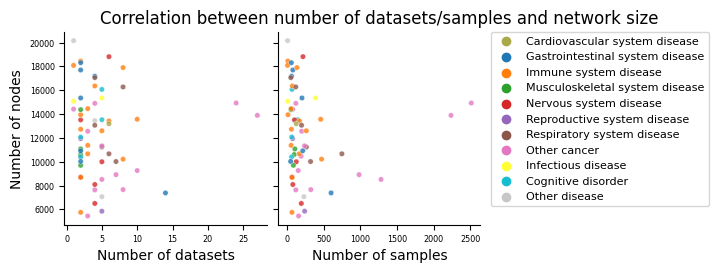

In [22]:
disease_info_df = pd.DataFrame.from_dict(disease_info, orient="index")

mpl.rcParams['xtick.labelsize']='xx-small'
mpl.rcParams['ytick.labelsize']='xx-small'

plt.figure(figsize=(40, 30))
ax = sns.pairplot(disease_info_df, 
                  x_vars=["Number of datasets","Number of samples"], y_vars=["Number of nodes"], 
                  hue= "Cluster", hue_order=legend_order, palette=c_palette, plot_kws={"s": 15,'alpha':0.8})
plt.title("Correlation between number of datasets/samples and network size")

ax._legend.remove()
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,prop={'size': 8})

plt.savefig(os.path.join(figures_dir, "datasets-samples_vs_nodes.png"), bbox_inches='tight',dpi=320)
plt.show()

## Figure: All disease groups on DOID hierarchy 

##### Exclude normal info for this figure

In [24]:
doids = list(doids)
doids.remove("normal")

##### Select all ancestors of the diseases in order to plot them

In [27]:
doid_only_numbers = {"doid:"+k : k for k,v in doid_mappings.items()}
#get the ontology hierachy as a networkx object
doid_hierarchy = pyobo.get_hierarchy('doid')
doid_hierarchy = nx.relabel_nodes(doid_hierarchy, doid_only_numbers)

all_to_graph = set()
for doid in doids:
    try:
        ancestors = pyobo.get_ancestors('doid', doid)
        ancestors = {entry.split(":")[-1] for entry in ancestors}
        all_to_graph.update(ancestors)
        all_to_graph.add(doid)
    except:
        continue
subgraph = doid_hierarchy.subgraph(all_to_graph)

##### Map color codes to clusters 

In [28]:
colors = {
    "Cardiovascular system disease" : '#aaa94a',
    "Gastrointestinal system disease" : '#1F77B4',
    'Immune system disease' : '#FF7F0E',
    "Musculoskeletal system disease" : '#2CA02C',
    "Nervous system disease" : '#D62728',
    "Reproductive system disease" : '#9467BD',
    "Respiratory system disease" : '#8C564B',
    "Other cancer" : '#E377C2',
    "Infectious disease" : '#ffff33',
    "Cognitive disorder" : '#17BECF', 
    "Other disease":"#c7c7c7",
}

color_per_node = {doid: colors[doid_cluster_mapping[doid]]for doid in doids}

##### Identify the doid of the cluster roots, and their color

In [29]:
cluster_roots = {}
for cluster in colors.keys():
    if "Other" in str(cluster):
         continue
    elif cluster == "Infectious disease":
         cluster_roots["0050117"]= cluster
    else:
         cluster_roots[name_to_doid_mappings[cluster.lower()]]= cluster
            
cluster_root_colors = {cluster: colors[cluster] for cluster in cluster_roots.values()}

##### labels for each disease node

In [30]:
labels = {doid: str((disease_info[doid]['Number of samples'], 
                     disease_info[doid]['Number of datasets']))+'\n'+"\n".join(doid_mappings[doid].split()) 
                 for doid in doids}


##### Plot

In [ ]:
pos = graphviz_layout(subgraph, prog="dot", root="4")
    
plt.figure(figsize=(600,100))
nx.draw(subgraph, pos, with_labels=True, font_size=70, verticalalignment="bottom", font_weight="bold", alpha=.5, node_size = 800, node_color= "k",arrows=False)

#doids used
nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=70, horizontalalignment="left",verticalalignment="top",font_weight="bold")
nx.draw_networkx_nodes(subgraph, pos, nodelist=doids, node_color=color_per_node.values(), node_size=4000)

#roots
nx.draw_networkx_labels(subgraph, pos, labels={k: "\n".join(v.split()) for k,v in cluster_roots.items()}, font_size=70, horizontalalignment="left",verticalalignment="top",font_weight="bold")
nx.draw_networkx_nodes(subgraph, pos, nodelist=cluster_roots.keys(), node_color=cluster_root_colors.values(), node_size=8000)

plt.savefig(os.path.join(figures_dir, "all_groups_on_hierarchy.pdf"),dpi=320)
plt.show()

ValueError: Image size of 71410x10019 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 60000x10000 with 1 Axes>

ValueError: Image size of 71410x10019 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 60000x10000 with 1 Axes>